In [1]:
import os 
import folium
from folium import plugins
#import rioxarray as rxr
#import earthpy as et
#import earthpy.spatial as es
import osmnx as ox

import pandas as pd
import geopandas
import matplotlib.pyplot as plt

/home/ben/miniconda3/lib/python3.9/site-packages/geopandas/_compat.py:112: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.3-CAPI-1.16.1). Conversions between both will be slow.
  warnings.warn(
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


https://towardsdatascience.com/retrieving-openstreetmap-data-in-python-1777a4be45bb

https://www.analyticsvidhya.com/blog/2020/06/guide-geospatial-analysis-folium-python/

### Test streamlit widdgets

In [3]:
import streamlit as st
import ipywidgets as widgets


In [4]:
widgets.Dropdown(
    options=['1', '2', '3'],
    value='2',
    description='Number:',
    disabled=False,
)

Dropdown(description='Number:', index=1, options=('1', '2', '3'), value='2')

## Fetch data

In [3]:
df_reims = ox.geocode_to_gdf('reims')
reims = 'Reims, France'

graph = ox.graph_from_place(reims, network_type='drive')


In [20]:
nodes, streets = ox.graph_to_gdfs(graph)
streets.head()
type(streets)

geopandas.geodataframe.GeoDataFrame

## Search for streets with scientific names

In [21]:
scientifics = streets[streets['name']=='Voie Jean Taittinger']

In [18]:
G = ox.graph_from_address('3 rue Adrien Sénéchal, 51100, REIMS')
#ox.plot_graph(G)

## Add points of interest

In [32]:
nodesGB_quartier, GB_quartier = ox.graph_to_gdfs(G)
GB_quartier['name']


u            v            key
36237904     36237992     0      Place des Combattants d'Afrique du Nord
36237988     36237990     0      Place des Combattants d'Afrique du Nord
36237989     36237904     0      Place des Combattants d'Afrique du Nord
             6764788688   0                          Avenue de Champagne
36237990     6764735882   0                      Avenue du Maréchal Juin
                                                  ...                   
10262806088  10262806089  0                                          NaN
10262806089  10262806088  0                                          NaN
             1083013576   0                                          NaN
             1083013695   0                                          NaN
10262806092  9880566153   0                           Rue Édouard Dufour
Name: name, Length: 3761, dtype: object

## Plot using folium explore (interactive)

In [33]:
m = streets.explore()
test.explore(m=m, color='red',
             tooltip="name", # show "name" column in the tooltip)
            )
GB_quartier.explore(m=m, color='green',
             tooltip="name", # show "name" column in the tooltip)
            )
m

## Add street view
https://www.mkrgeo-blog.com/open-street-view-with-python-folium-map/

https://elvinouyang.github.io/project/how-to-query-google-street-view-api-with-python/


In [38]:
test

,,,osmid,oneway,highway,reversed,length,lanes,ref,name,maxspeed,bridge,geometry,junction,tunnel,access,width
u,v,key,,,,,,,,,,,,,,,
23218073,23218064,0,"[779386768, 683144866, 683144867]",True,motorway,False,1393.540,3,A 344,Voie Jean Taittinger,90,yes,"LINESTRING (4.04335 49.23148, 4.04394 49.23106...",NaN,NaN,NaN,NaN
23218075,270759660,0,111245364,True,motorway,False,486.002,3,A 344,Voie Jean Taittinger,90,NaN,"LINESTRING (4.04478 49.23071, 4.04406 49.23117...",NaN,NaN,NaN,NaN
23218084,23218102,0,"[683144858, 683144859, 683144860]",True,motorway,False,426.767,3,A 344,Voie Jean Taittinger,90,NaN,"LINESTRING (4.02644 49.24753, 4.02470 49.24877...",NaN,NaN,NaN,NaN
23218102,23218097,0,"[683144857, 818660775, 818660774, 683144855]",True,motorway,False,651.878,2,A 344,Voie Jean Taittinger,90,yes,"LINESTRING (4.02248 49.25037, 4.02150 49.25097...",NaN,NaN,NaN,NaN
23218104,296876620,0,683144862,True,motorway,False,805.088,3,A 344,Voie Jean Taittinger,90,NaN,"LINESTRING (4.02042 49.25146, 4.02087 49.25122...",NaN,NaN,NaN,NaN
270759660,270764684,0,683144863,True,motorway,False,275.740,4,A 344,Voie Jean Taittinger,90,NaN,"LINESTRING (4.04050 49.23406, 4.03959 49.23486...",NaN,NaN,NaN,NaN
270764684,345210694,0,"[683144864, 683144863]",True,motorway,False,925.271,"[3, 4]",A 344,Voie Jean Taittinger,90,NaN,"LINESTRING (4.03819 49.23603, 4.03594 49.23796...",NaN,NaN,NaN,NaN
296876620,352819958,0,683144862,True,motorway,False,167.050,3,A 344,Voie Jean Taittinger,90,NaN,"LINESTRING (4.02787 49.24611, 4.02824 49.24577...",NaN,NaN,NaN,NaN
300388724,23218104,0,"[111245361, 818660772, 818660773, 683144862]",True,motorway,False,634.193,3,A 344,Voie Jean Taittinger,90,yes,"LINESTRING (4.01230 49.25340, 4.01472 49.25305...",NaN,NaN,NaN,NaN


In [39]:
#df = pd.read_csv("cf_geo.csv")
df = test
fc=folium.FeatureGroup(name="CF_GEO",overlay=True)
#cf_cluster = MarkerCluster(name="CF_GEO").add_to(map)
for i,row in df.iterrows():
    lat = df.at[i, 'u']  #latitude
    lng = df.at[i, 'v']  #longitude
    sp = df.at[i, 'sp']
    stat = df.at[i,'status'] 

popup = df.at[i,'sp'] +'<br>' + str(df.at[i, 'street']) + '<br>' + str(df.at[i, 'post code']) + '<br>' + '<a href="https://www.google.com/maps?layer=c&cbll=' + str(df.at[i, 'lat']) + ',' + str(df.at[i, 'lng']) + '" target="blank">GOOGLE STREET VIEW</a>'
cf_marker = folium.Marker(location=[lat,lng], popup=popup, icon = folium.Icon(color='green', icon='glyphicon-calendar'))
cf_cluster.add_child(cf_marker)

KeyError: 'u'

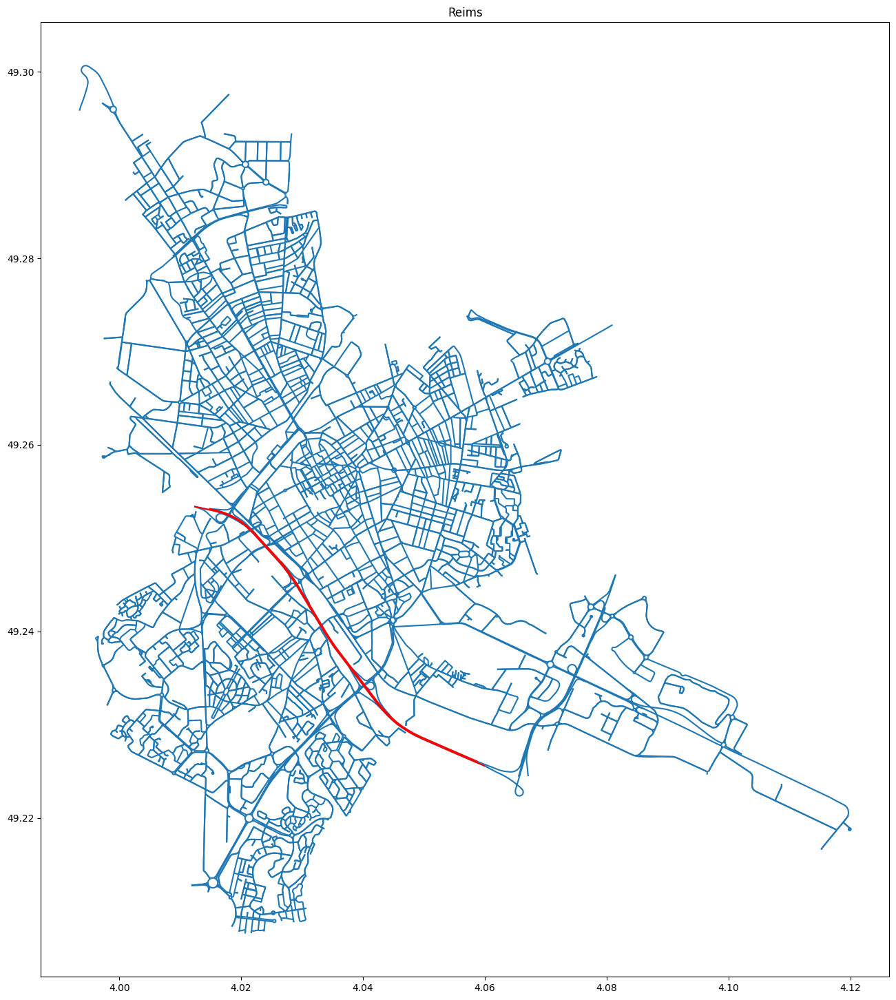

simple mpl


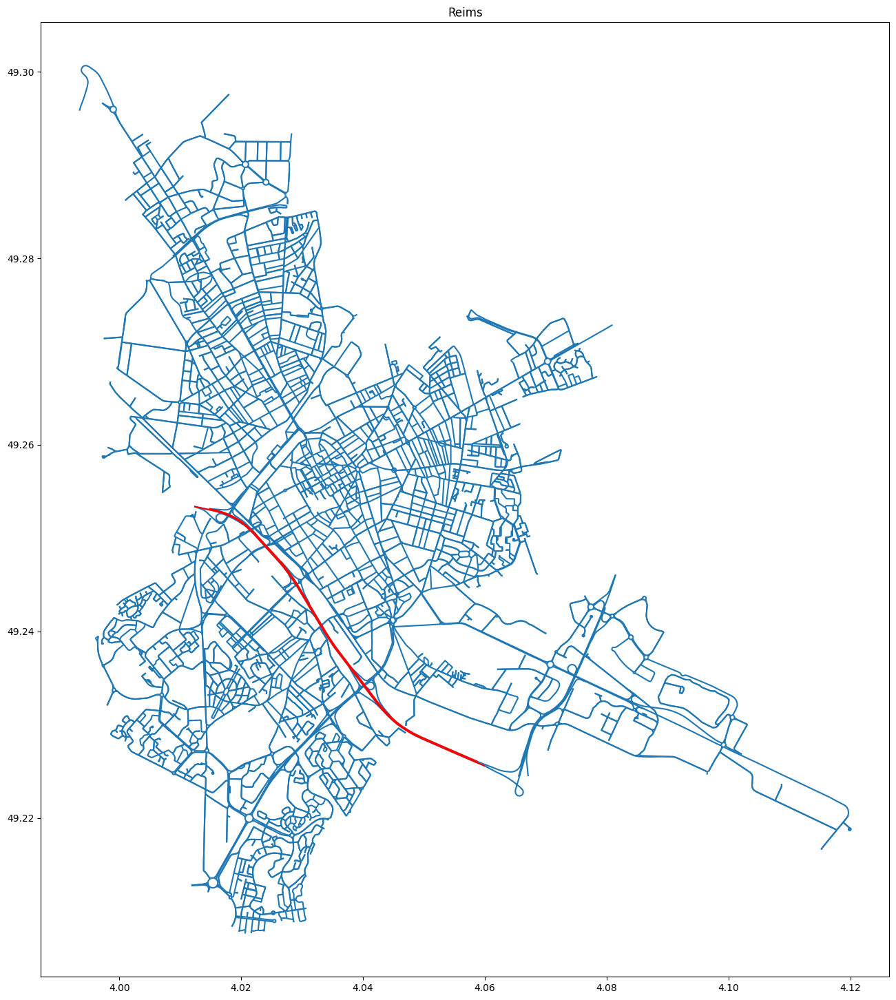

In [22]:
fig, ax = plt.subplots(figsize=(24, 18))
streets.plot(ax=ax, legend=True)
test.plot(ax=ax, color='red')
plt.title("Reims")
plt.show(False)
print('simple mpl')
